In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import scanpy as sc
from scipy import stats
import os

from scipy import spatial
from scipy import sparse
from scipy.interpolate import CubicSpline
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.neighbors import NearestNeighbors
import networkx as nx
from umap import UMAP

import json

In [2]:
import importlib

from scroutines import powerplots
from scroutines.miscu import is_in_polygon

import utils_merfish
importlib.reload(utils_merfish)
from utils_merfish import rot2d, st_scatter, st_scatter_ax, plot_cluster, binning
from utils_merfish import RefLineSegs

from merfish_datasets import merfish_datasets
from merfish_datasets import merfish_datasets_params

In [3]:
def get_qc_metrics(df):
    """
    return metrics
     - key
      - (name, val, medval, bins)
    """
    metrics = {}
    cols  = ['volume', 'gncov', 'gnnum']
    names = ['cell volume', 'num transcripts', 'num genes']
    
    for col, name in zip(cols, names):
        val = df[col].values
        medval = np.median(val)
        bins = np.linspace(0, 10*medval, 50)
        
        metrics[col] = (name, val, medval, bins)
    return metrics

def get_norm_counts(adata, scaling=500):
    """norm - equalize the volume to be 500 for all cells
    """
    cnts = adata.X
    vol = adata.obs['volume'].values
    normcnts = cnts/vol.reshape(-1,1)*scaling
    adata.layers['norm'] = normcnts
    
    return normcnts

In [4]:
def get_largest_spatial_components(adata, k=100, dist_th=80):
    """
    k - number of neighbors
    dist_th - distance to call connected components
    
    returns
        - indices of the largest components
    """
    XY = adata.obs[['x', 'y']].values
    nc = len(XY)

    # kNN
    nbrs = NearestNeighbors(n_neighbors=k, algorithm='auto').fit(XY)
    distances, indices = nbrs.kneighbors(XY)

    # filtered by distance th
    val = distances[:,1:].reshape(-1,)
    i = np.repeat(indices[:,0],k-1)
    j = indices[:,1:].reshape(-1,)

    indices_filtered = np.vstack([i[val < dist_th], j[val < dist_th]]).T

    G = nx.Graph()
    G.add_nodes_from(np.arange(nc))
    G.add_edges_from(indices_filtered)
    components = nx.connected_components(G)
    largest_component = max(components, key=len)
    indices_selected = np.array(list(largest_component))

    print(f"fraction of cells included: {len(largest_component)/nc: .2f}" )
    
    return indices_selected, XY

# load data and construct adata 

In [5]:
np.random.seed(0)

In [6]:
outdir     = "/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/results_merfish/plots_240718"
outdatadir = "/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/organized"
!mkdir -p $outdir
!mkdir -p $outdatadir

In [7]:
merfish_datasets, merfish_datasets_params

({'P14NRa_ant': 'merfish_06142023/ant/region0',
  'P28NRa_ant': 'merfish_06142023/ant/region1',
  'P14NRa_pos': 'merfish_06142023/pos/region0',
  'P28NRa_pos': 'merfish_06142023/pos/region1',
  'P21NRa_ant': 'merfish_20231114/region0',
  'P21DRa_ant': 'merfish_20231114/region2',
  'P28DRa_ant': 'merfish_20231114/region1',
  'P21NRa_pos': 'merfish_20231120/region0',
  'P21DRa_pos': 'merfish_20231120/region1',
  'P28DRa_pos': 'merfish_20231120/region2',
  'P14NRb_ant': 'merfish_202404051211/region_0',
  'P28NRb_ant': 'merfish_202404051211/region_1',
  'P14NRb_pos': 'merfish_202404051214/region_0',
  'P28NRb_pos': 'merfish_202404051214/region_1',
  'P21NRb_ant': 'merfish_202404091526/region_2',
  'P21DRb_ant': 'merfish_202404091526/region_1',
  'P28DRb_ant': 'merfish_202404091526/region_0',
  'P21NRb_pos': 'merfish_202404091601/region_0',
  'P21DRb_pos': 'merfish_202404091601/region_2',
  'P28DRb_pos': 'merfish_202404091601/region_1',
  'P14NR_ant': 'merfish_06142023/ant/region0',
  'P28N

In [8]:
name = 'P28NRa_ant'
dirc = merfish_datasets[name]
params = merfish_datasets_params[name]

f1 = os.path.join('/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish', dirc, 'cell_by_gene.csv')
f2 = os.path.join('/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish', dirc, 'cell_metadata.csv')
output      = outdatadir + f'/{name}_ctxglut_240722.h5ad'

dirc, params

('merfish_06142023/ant/region1', {'rotation': 90})

In [9]:
df1 = pd.read_csv(f1)
df2 = pd.read_csv(f2)
genes = df1.iloc[:,1:-50].columns
blnks = df1.iloc[:, -50:].columns
df = df2.join(df1)

print(df1.shape, df2.shape, len(genes), len(blnks))
assert np.all(df['cell'] == df['EntityID'])

df['fpcov'] =  df[blnks].sum(axis=1)
df['gncov'] =  df[genes].sum(axis=1)
df['gnnum'] = (df[genes]>0).sum(axis=1)
metacols = np.hstack([df2.columns, 'gncov', 'gnnum', 'fpcov', ])

# metrics
metrics = get_qc_metrics(df)  # median, bin, distribution

# adata
adata = ad.AnnData(X=df[genes].values, 
                   obsm=dict(blanks=df[blnks].values),
                   obs=df[metacols], 
                   var=pd.DataFrame(index=genes), 
                  )

(330729, 551) (330729, 17) 500 50


/u/home/f/f7xiesnm/.conda/envs/napari/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


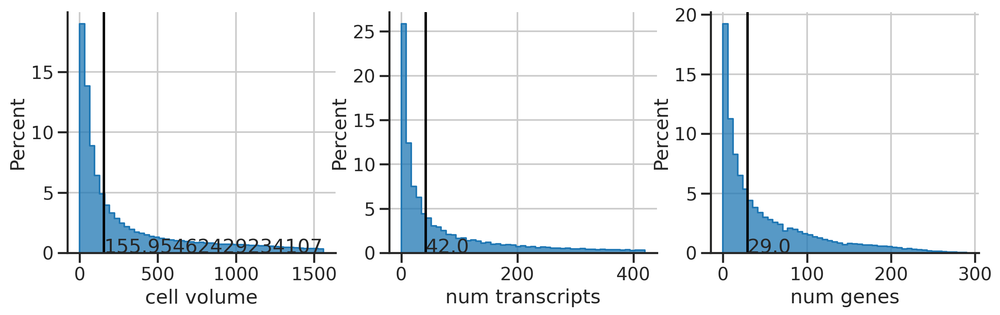

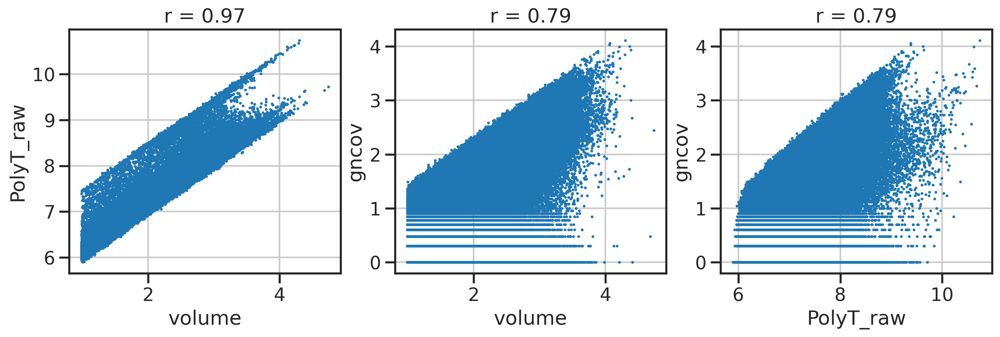

In [10]:
fig, axs = plt.subplots(1,3,figsize=(3*5,1*4))
for ax, (key, metric) in zip(axs, metrics.items()):
    (name, val, medval, bins) = metric
    
    sns.histplot(val, element='step', bins=bins, ax=ax, stat='percent')
    sns.despine(ax=ax)
    ax.axvline(medval, color='k',)
    ax.text(medval, 0, medval)
    ax.set_xlabel(name)
plt.show()


factors = np.array(['volume', 'PolyT_raw', 'gncov'])
pairs = [[0,1], [0,2], [1,2]]
fig, axs = plt.subplots(1,3,figsize=(3*5,1*4))
for pair, ax in zip(pairs, axs):
    f0 = factors[pair[0]]
    f1 = factors[pair[1]]
    x, y = np.log10(1+df[f0]), np.log10(1+df[f1])
    r, p = stats.pearsonr(x, y)
    ax.scatter(x, y, s=1)
    ax.set_xlabel(f0)
    ax.set_ylabel(f1)
    ax.set_title(f'r = {r:.2g}')
    
plt.show()

# rotation

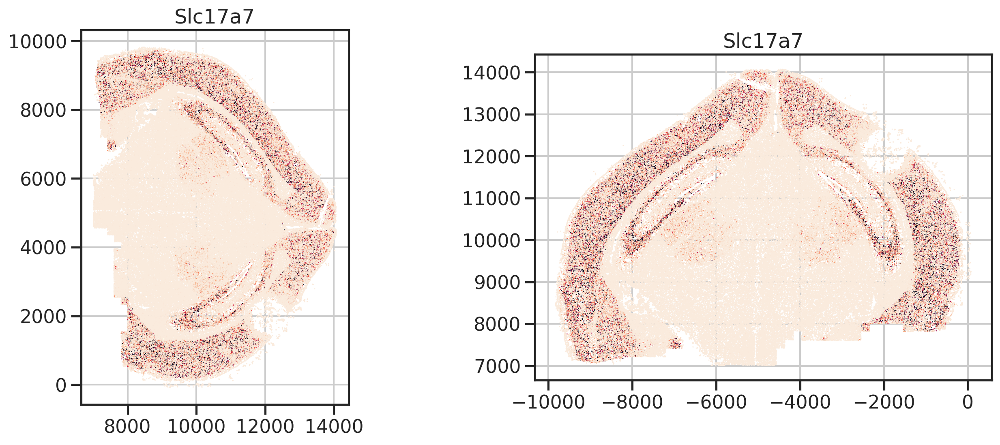

In [11]:
rotation = params['rotation']

# calibrate coordinates
adata.uns['rotation'] = rotation

x = adata.obs['center_x']
y = adata.obs['center_y']
xr, yr = rot2d(x, y, rotation)
adata.obs['x'] = xr
adata.obs['y'] = yr

gn = 'Slc17a7'
g = adata[:,gn].X.reshape(-1,)
fig, axs = plt.subplots(1,2,figsize=(2*8,1*6))
ax1, ax2 = axs
st_scatter_ax(fig, ax1, x,  y,  gexp=g, title=gn, axis_off=False)
st_scatter_ax(fig, ax2, xr, yr, gexp=g, title=gn, axis_off=False)
plt.show()

# filter #1 basic QC metrics

In [12]:
print(adata.shape)
# basic QC filter
cond = np.all([
    adata.obs['volume'] > 50, 
    adata.obs['volume'] < 2000, 
    adata.obs['fpcov'] < 5,
    adata.obs['gncov'] > 10,
    adata.obs['x'] < -4500,
    # adata.obs['y'] > -5100,
], axis=0)

adata = adata[cond]
print(adata.shape)

(330729, 500)
(112269, 500)


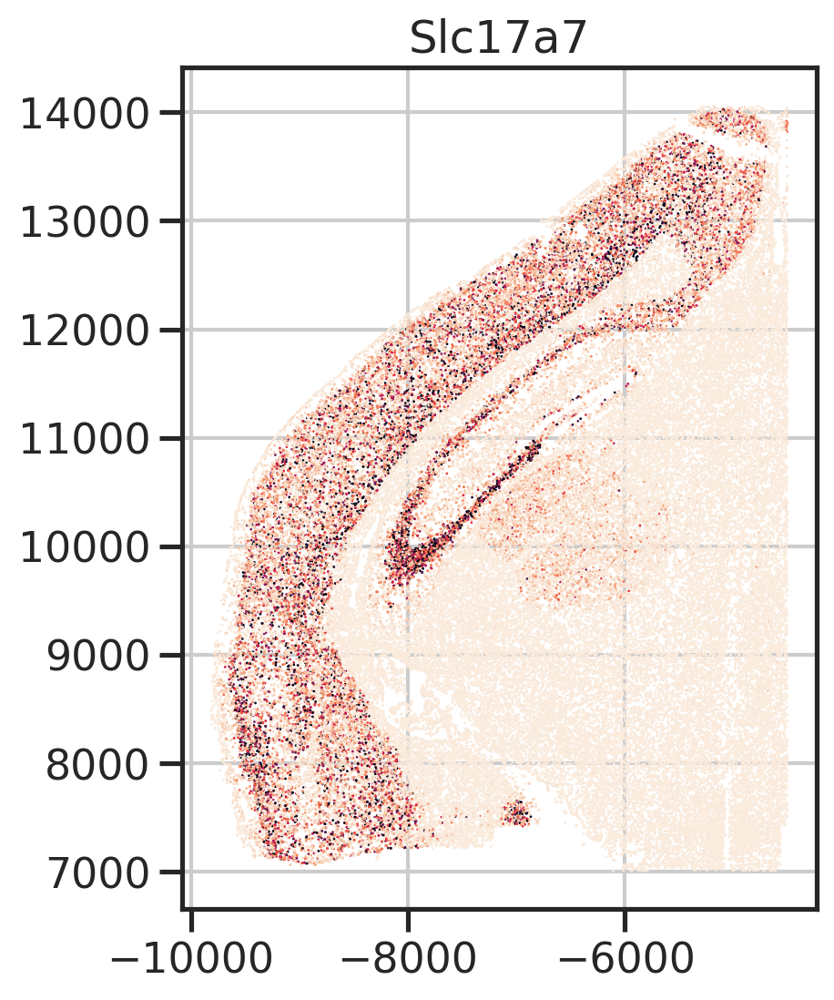

In [13]:
gns = [
    'Slc17a7',
    ]
for gn in gns: 
    g = adata[:,gn].X.reshape(-1,)
    xr = adata.obs['x']
    yr = adata.obs['y']
    fig, ax = plt.subplots(1,1,figsize=(1*8,1*6))
    st_scatter_ax(fig, ax, xr, yr, gexp=g, title=gn, axis_off=False)
    plt.show()

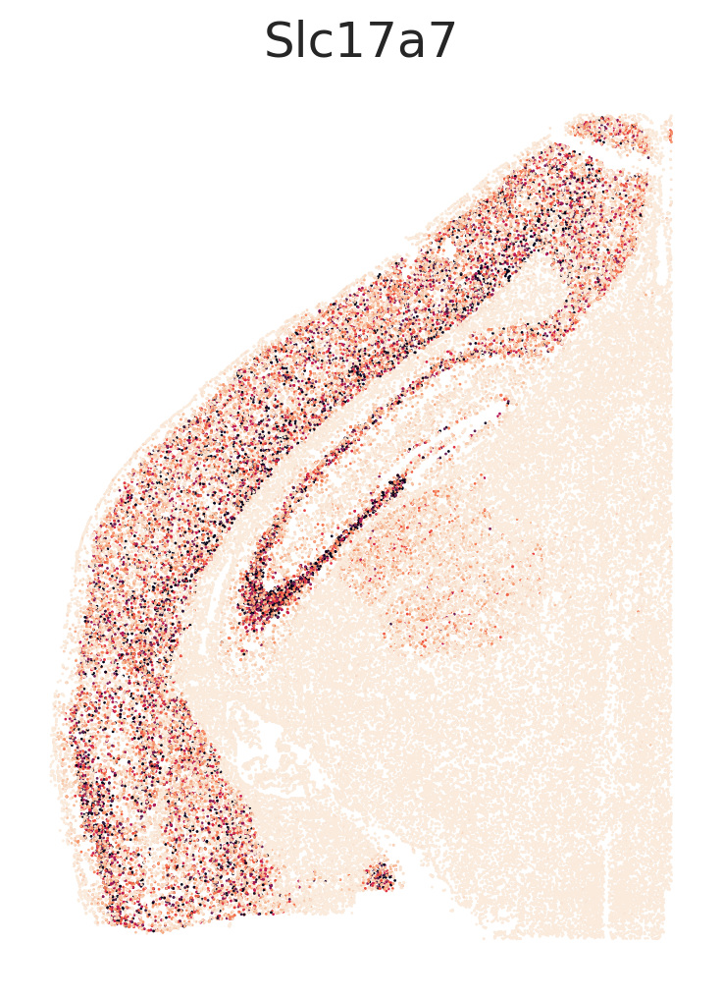

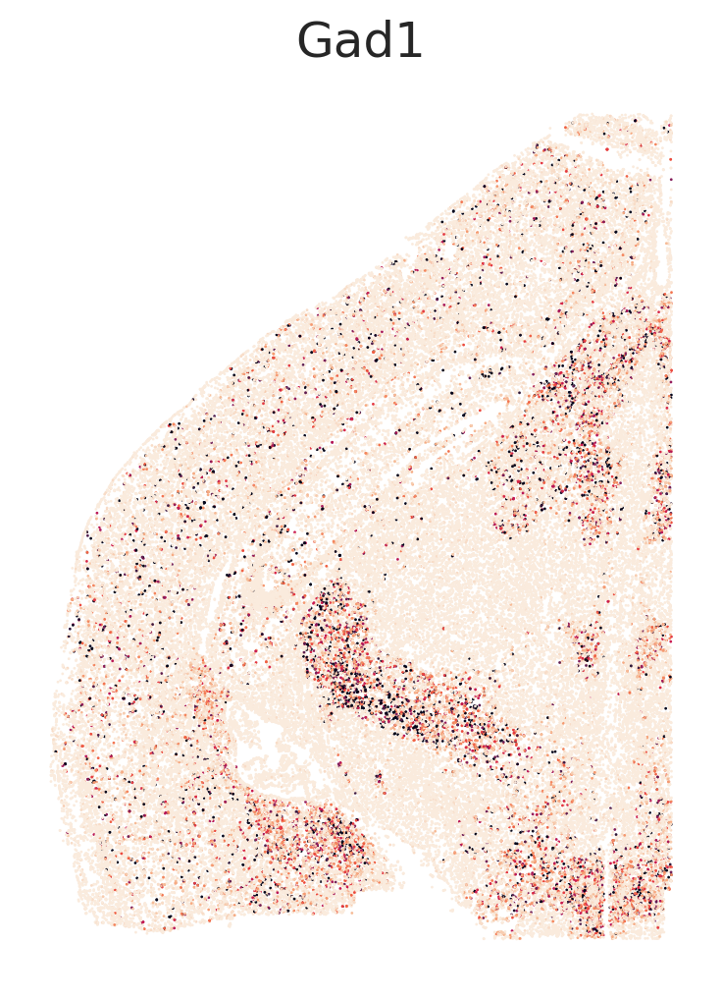

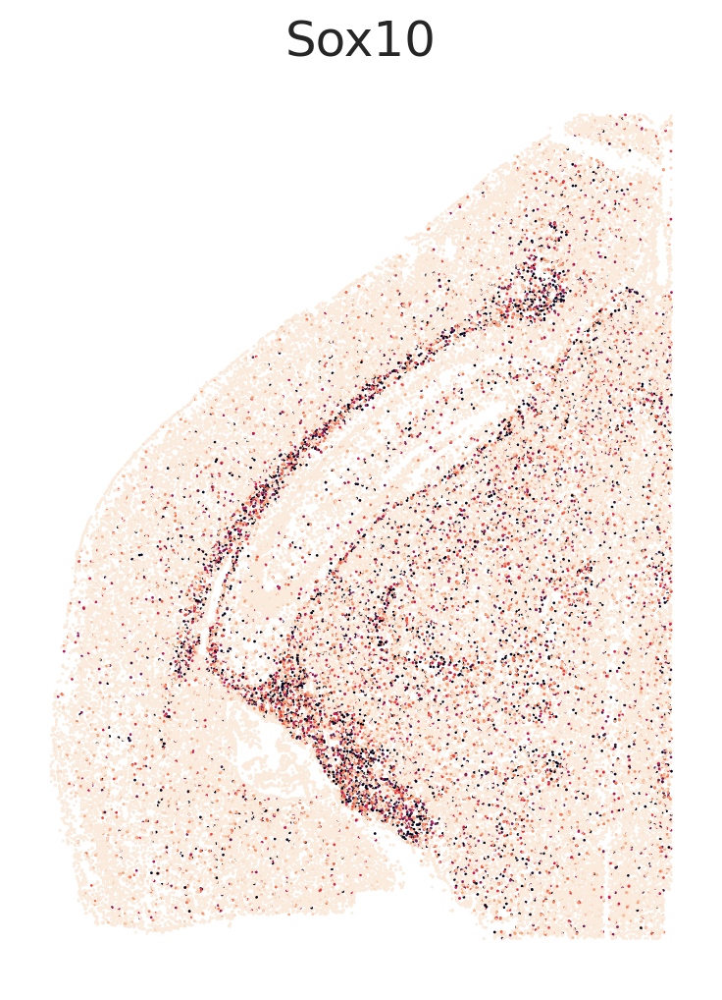

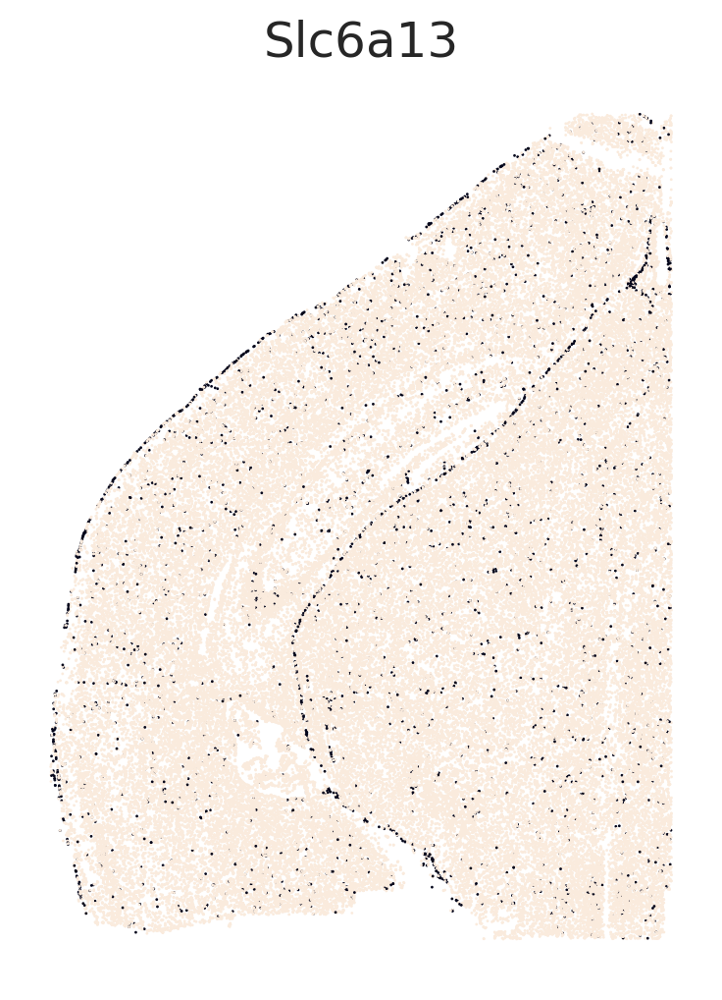

In [14]:
gns = [
    'Slc17a7',
    'Gad1',
    'Sox10', 
    'Slc6a13',
    ]
for gn in gns: 
    g = adata[:,gn].X.reshape(-1,)
    xr = adata.obs['x']
    yr = adata.obs['y']
    fig, ax = plt.subplots(1,1,figsize=(1*8,1*6))
    st_scatter_ax(fig, ax, xr, yr, gexp=g, title=gn, axis_off=False)
    ax.axis(False)
    plt.show()

# spatial domain analysis

In [15]:
importlib.reload(utils_merfish)

<module 'utils_merfish' from '/u/project/zipursky/f7xiesnm/v1-bb/v1/myvisctx/analysis_merfish/utils_merfish.py'>

# get reference line based on cluster 9
- iterative

In [16]:
def line_fitting(XY):
    """
    """
    from utils_merfish import RefLineSegs
    
    XY = XY[np.argsort(XY[:,0])]
    x, y = XY[:,0], XY[:,1]

    # fit a line
    poly_fit = np.poly1d(np.polyfit(x, y, 4))
    x_fit = np.linspace(min(x), max(x), 100)
    y_fit = poly_fit(x_fit)

    # calc depth
    XY_fit = np.vstack([x_fit, y_fit]).T
    XY_obj = RefLineSegs(XY_fit)
    depth, width = XY_obj.dists_to_qps(XY)
    DW = np.vstack([depth, width]).T

    return XY, XY_fit, XY_obj, DW, poly_fit 

/tmp/ipykernel_126121/1660624550.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['x2'] = xr2


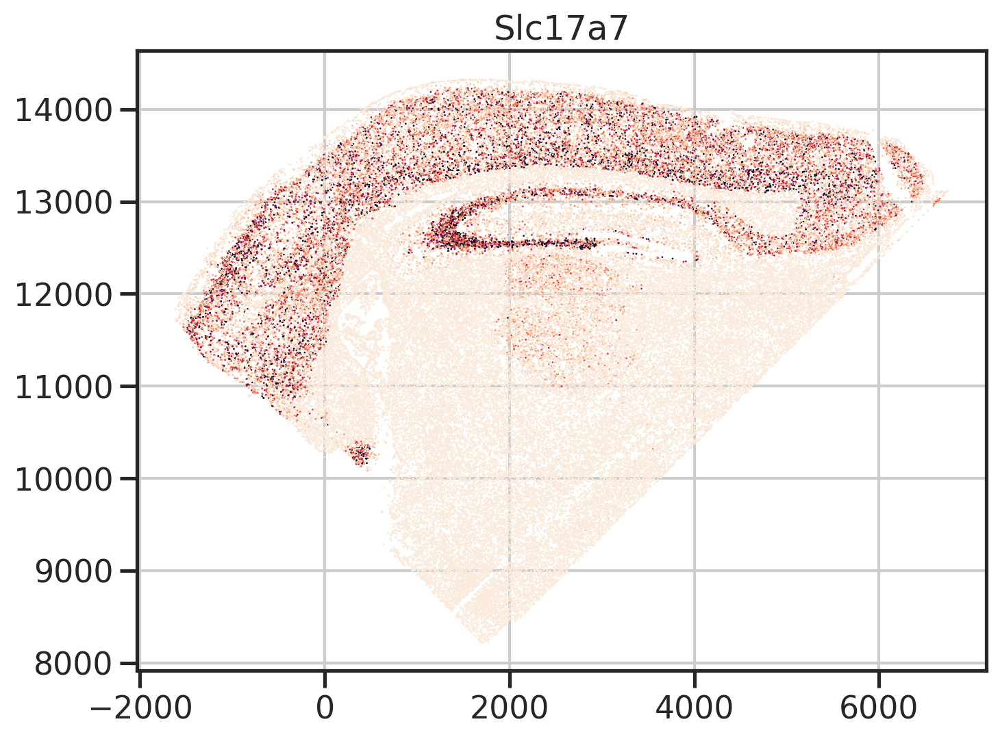

In [17]:
xr, yr = adata.obs['x'], adata.obs['y']
xr2, yr2 = rot2d(xr, yr, -45) 
adata.obs['x2'] = xr2
adata.obs['y2'] = yr2

gns = [
    'Slc17a7',
    ]
for gn in gns: 
    g = adata[:,gn].X.reshape(-1,)
    fig, ax = plt.subplots(1,1,figsize=(1*8,1*6))
    st_scatter_ax(fig, ax, xr2, yr2, gexp=g, title=gn, axis_off=False)
    plt.show()

In [18]:
def two_step_cut(x, y, xcut, ycut1, ycut2):
    """apply y1 left of x, y2 right of x 
    """
    cond = x < xcut
    overall_cond = np.logical_or(
        np.logical_and(cond,  y > ycut1), 
        np.logical_and(~cond, y > ycut2),)
    
    return overall_cond
    

In [19]:
cond1 = two_step_cut(adata.obs['x2'], adata.obs['y2'], 0, 11000, 13500)  
cond2 = np.array(adata[:,'Slc6a13'].X).reshape(-1,)>0
adata_pia = adata[cond1 & cond2] # requires [0,1,2...,N]
adata_pia

View of AnnData object with n_obs × n_vars = 856 × 500
    obs: 'EntityID', 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'PolyT_raw', 'PolyT_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'gncov', 'gnnum', 'fpcov', 'x', 'y', 'x2', 'y2'
    uns: 'rotation'
    obsm: 'blanks'

In [20]:
adata.obs['blended_domains'] = 0

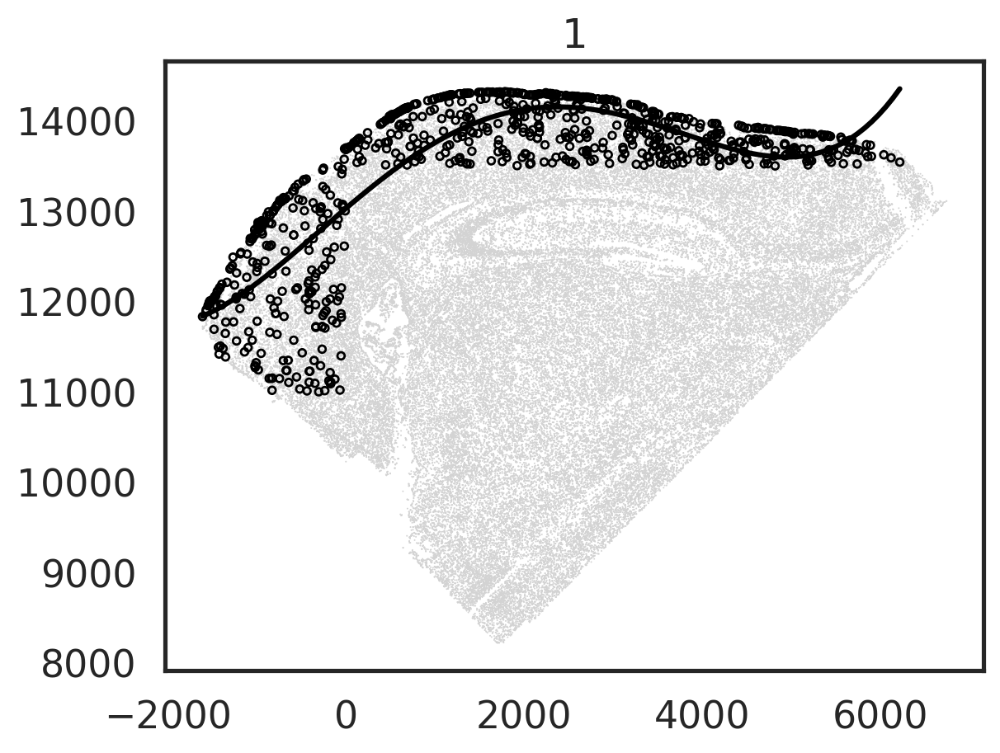

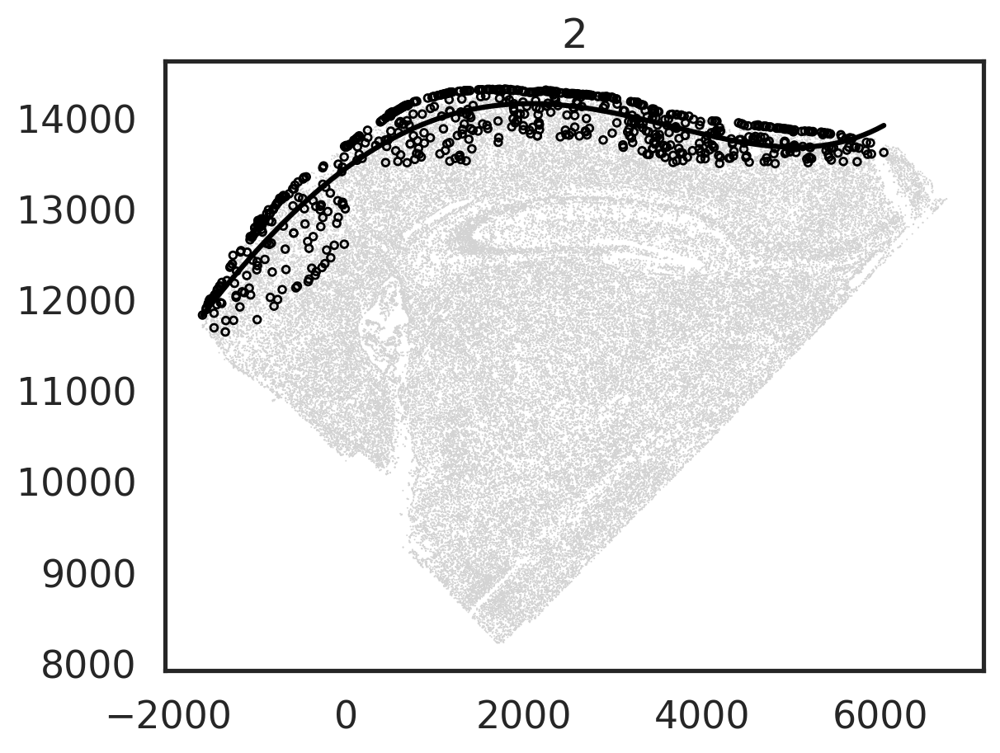

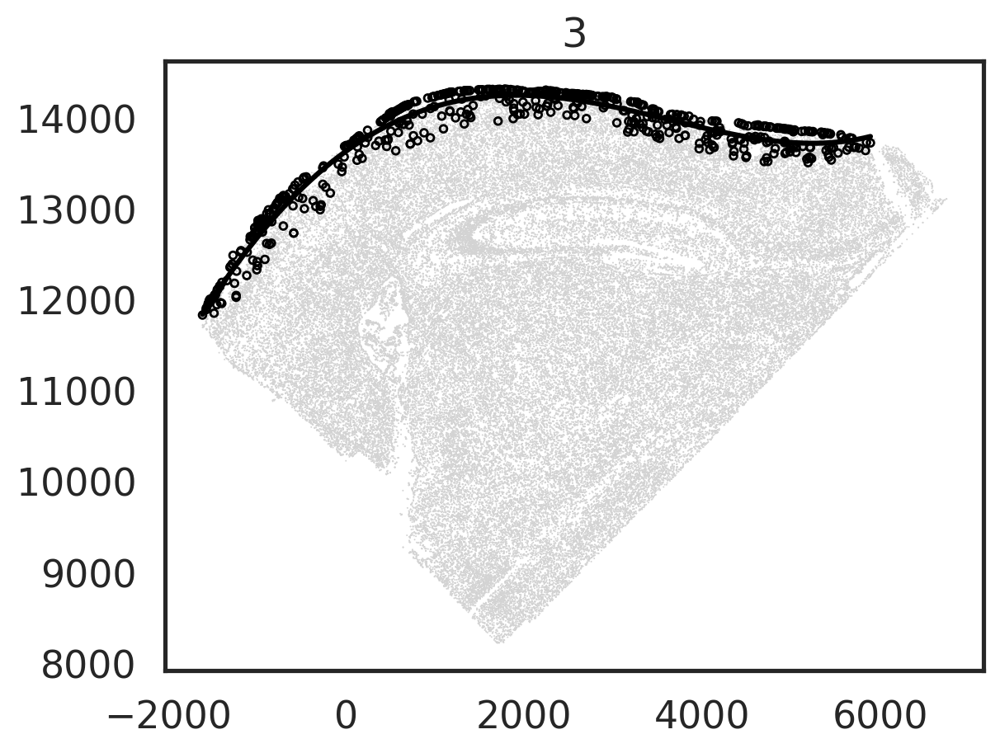

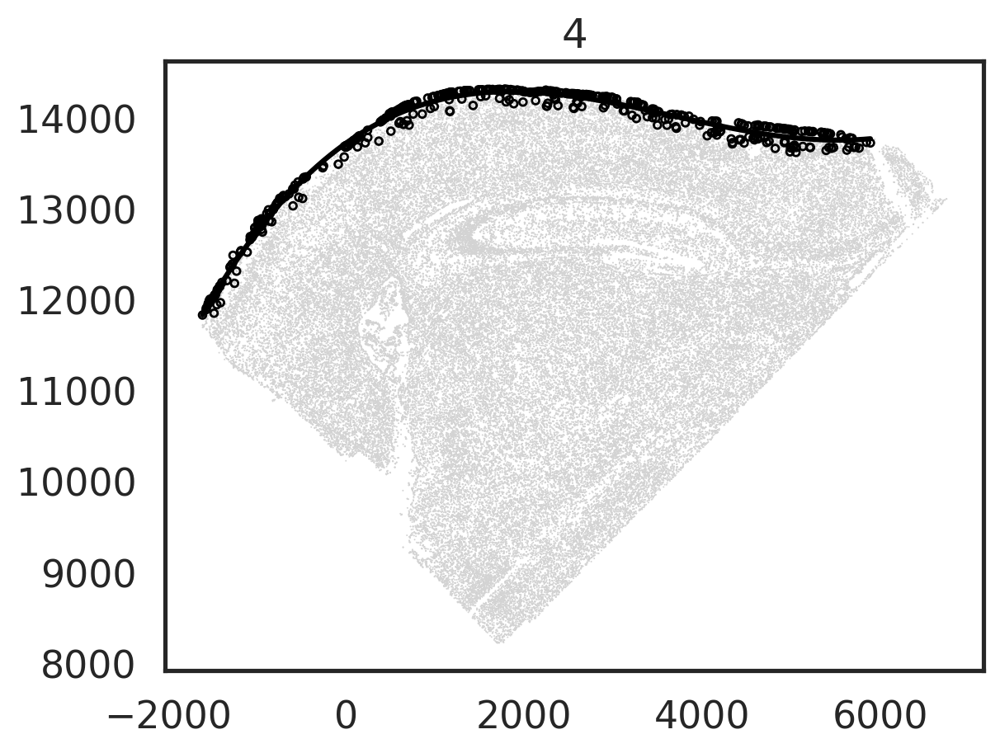

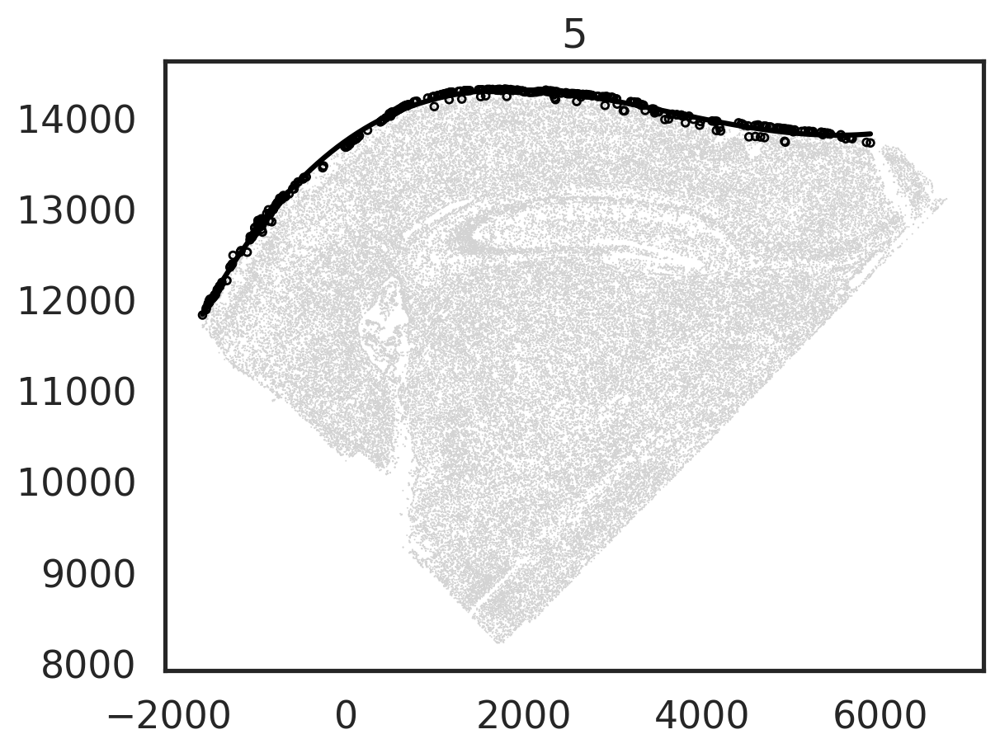

In [21]:
XY = adata_pia.obs[['x2', 'y2']].values
for i in range(5):
    XY, XY_fit, XY_obj, DW, poly_fit = line_fitting(XY)
    depth, width = DW[:,0], DW[:,1]
    cond = depth < 0.5*np.percentile(depth, 95)

    with sns.axes_style('white'): 
        fig, ax = plt.subplots()
        xr =  adata.obs['x2']
        yr =  adata.obs['y2']
        ax.scatter(xr, yr, s=0.5, color='lightgray', edgecolor='none')
        
        x, y = XY[:,0], XY[:,1]
        x_fit, y_fit = XY_fit[:,0], XY_fit[:,1]
        ax.scatter(x, y, s=10, edgecolors='k', facecolors='none', linewidth=1)
        ax.plot(x_fit, y_fit, color='k')
        ax.set_title(i+1)
        
        

        
        plt.show()

    XY = XY[cond]
    # break

In [22]:
# save
XY = adata.obs[['x2', 'y2']].values
depth, width = XY_obj.dists_to_qps(XY)
adata.uns['ref_line'] = XY_fit.tolist()
adata.obs['depth'] = depth
adata.obs['width'] = width

In [23]:
XY_fit = np.array(adata.uns['ref_line'])
_, ref_width = XY_obj.dists_to_qps(XY_fit)
ref_width_x = np.interp(np.arange(0,np.max(ref_width),500), ref_width, XY_fit[:,0])
ref_width_y = poly_fit(ref_width_x)

dx = 0.01
dy = poly_fit(ref_width_x+dx) - ref_width_y
s = np.sqrt(dx**2+dy**2)
dx, dy = 1/s*dx, 1/s*dy

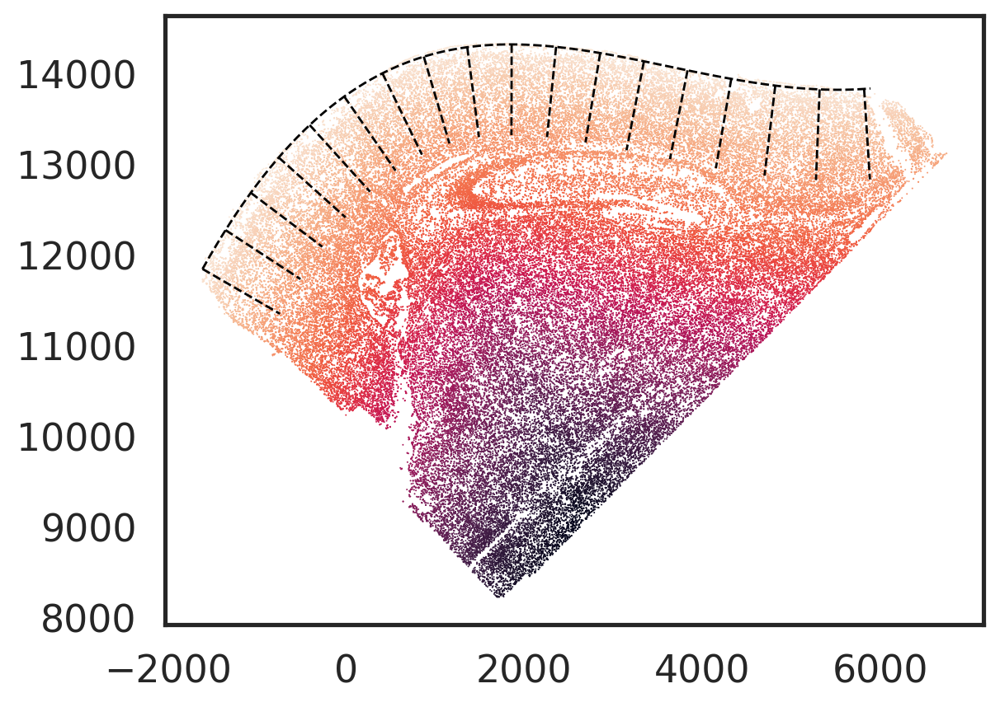

In [24]:
with sns.axes_style('white'): 
    fig, ax = plt.subplots()
    xr =  adata.obs['x2']
    yr =  adata.obs['y2']
    # ax.scatter(xr, yr, s=0.5, color='lightgray', edgecolor='none')
    ax.scatter(xr, yr, s=0.5, c=adata.obs['depth'], edgecolor='none', cmap='rocket_r')

    x_fit, y_fit = XY_fit[:,0], XY_fit[:,1]
    ax.plot(x_fit, y_fit, color='k', linestyle='--', linewidth=1)
    for i in range(len(ref_width_x)):
        scale = 1000
        _x, _y = ref_width_x[i], ref_width_y[i]
        _dx, _dy = dx[i], dy[i]
        _dx, _dy = scale*_dx, scale*_dy
                    

        ax.plot([_x, _x+_dy], 
                [_y, _y-_dx], color='k', linestyle='--', linewidth=1) #y, c=ref_width, cmap='rainbow', s=1) # color='k', linestyle='--')
    
    plt.show()

# filter #3. select cortex

In [25]:
cond = np.all([
    adata.obs['depth'] < 1100,
    # adata.obs['width'] > 500,
    # adata.obs['width'] < 6000,
    ], axis=0)
adatasub = adata[cond].copy()

XY = adatasub.obs[['x2', 'y2']].values
x2, y2 = XY[:,0], XY[:,1]
d, w = XY_obj.dists_to_qps(XY)

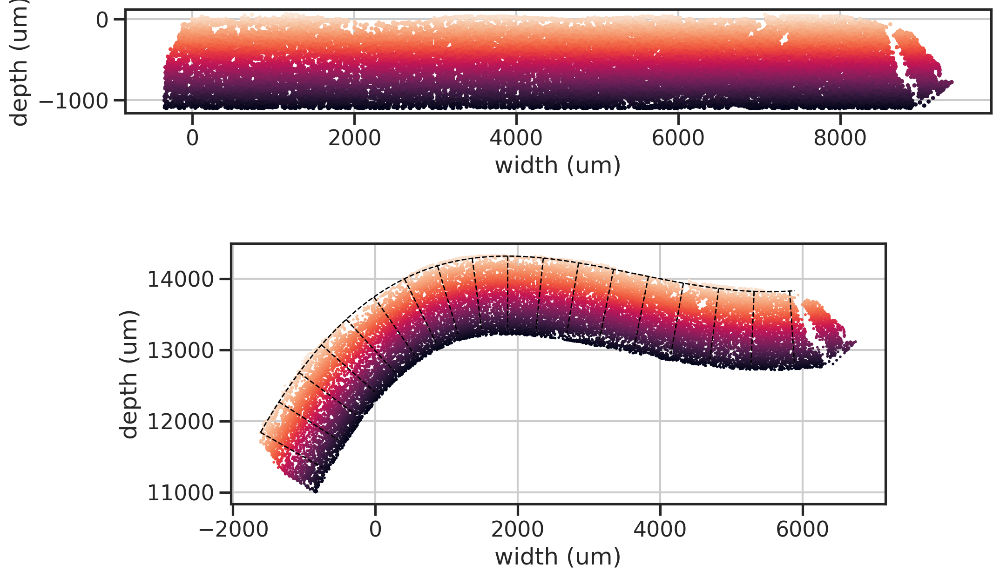

In [26]:
fig, axs = plt.subplots(2,1,figsize=(12*1,4*2))
ax = axs[0]
ax.scatter(w, -d, c=d, s=10, edgecolor='none', cmap='rocket_r')

ax.set_aspect('equal')
ax.set_xlabel('width (um)')
ax.set_ylabel('depth (um)')
# ax.set_xlim([2000,5000])
# ax.set_ylim([-200,100])


ax = axs[1]
ax.scatter(x2, y2, c=d, s=4, edgecolor='none', cmap='rocket_r') 
x_fit, y_fit = XY_fit[:,0], XY_fit[:,1]
ax.plot(x_fit, y_fit, color='k', linestyle='--', linewidth=1)
for i in range(len(ref_width_x)):
    scale = 1000
    _x, _y = ref_width_x[i], ref_width_y[i]
    _dx, _dy = dx[i], dy[i]
    _dx, _dy = scale*_dx, scale*_dy


    ax.plot([_x, _x+_dy], 
            [_y, _y-_dx], color='k', linestyle='--', linewidth=1) 

ax.set_aspect('equal')
ax.set_xlabel('width (um)')
ax.set_ylabel('depth (um)')
plt.show()



# Plot area and layer signatures

KeyError: 'jnorm'

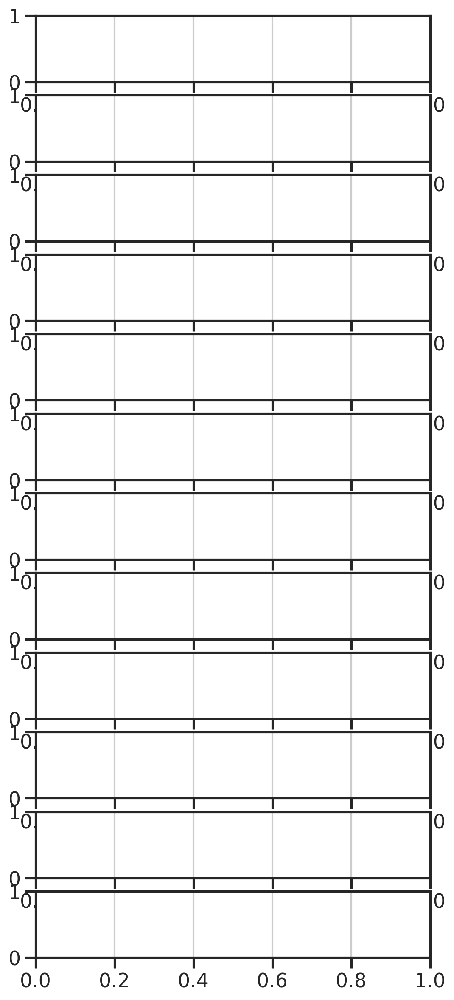

In [57]:
gns = [ 
    'Stard8', 'Cux2', 'Whrn', 'Syt2', 'Tle4', 'Syt6', 'Ccn2', 
    'Scnn1a', 'Igfbp4', 'Syt17', 'C1ql3', 'Rorb', 
] 
x =   adatasub.obs['width']
y =  -adatasub.obs['depth']
n = len(gns)

fig, axs = plt.subplots(n,1,figsize=(1*6,n*1.2))
for i, (ax, gn) in enumerate(zip(axs, gns)):
    
    g = np.log2(1+adatasub[:,gn].layers['jnorm'].reshape(-1,))
    vmax = np.percentile(g, 99)
    vmin = np.percentile(g,  0)
    sorting = np.argsort(g)
    
    p = utils_merfish.st_scatter_ax(fig, ax,  x[sorting],  y[sorting],  gexp=g[sorting], s=3, title='', vmin=vmin, vmax=vmax, cmap='rocket_r')
    ax.set_aspect('equal')
    
    ax.set_title(gn, loc='left', va='center', ha='right', y=0.5, pad=None)
    fig.colorbar(p, pad=0, shrink=0.5, aspect=5, ticks=[np.round(vmin, decimals=1), np.round(vmax-0.1, decimals=1)])
    
    ax.hlines(-np.arange(0,1200,200), np.min(x)-100, np.min(x), color='gray', linestyle='-', linewidth=1)
    ax.vlines(np.arange(500,6000+1,500), 0, -1000, color='k', linestyle='--', linewidth=1) # , zorder=0)
    ax.axhline(0, color='k', linestyle='--', linewidth=1) #, zorder=0)
    
fig.subplots_adjust(hspace=0)
plt.show()

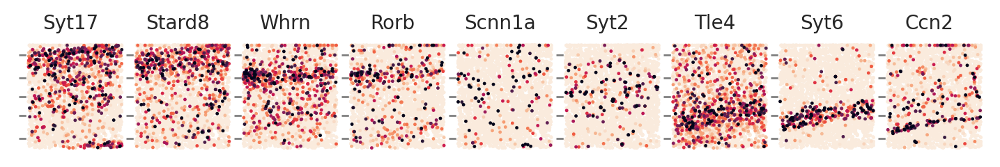

In [145]:
gns = [ 
    'Syt17', 'Stard8', 'Whrn', 'Rorb', 'Scnn1a', 'Syt2', 'Tle4', 'Syt6', 'Ccn2', 
] 
x =   adatasub.obs['width']
y =  -adatasub.obs['depth']
cutoff = np.logical_and(x>2000, x<3000)
n = len(gns)

fig, axs = plt.subplots(1,n,figsize=(n*1,3*1.2))
for i, (ax, gn) in enumerate(zip(axs, gns)):
    
    g = np.log2(1+adatasub[:,gn].layers['jnorm'].reshape(-1,))
    x = x[cutoff]
    y = y[cutoff]
    g = g[cutoff]
    vmax = np.percentile(g, 99)
    vmin = np.percentile(g,  0)
    sorting = np.argsort(g)
    
    p = utils_merfish.st_scatter_ax(fig, ax,  x[sorting],  y[sorting],  gexp=g[sorting], 
                                    s=3, title='', vmin=vmin, vmax=vmax, cmap='rocket_r')
    ax.set_aspect('equal')
    
    ax.set_title(gn, fontsize=10) #, loc='left', va='center', ha='right', y=0.5, pad=None)
    # ax.hlines(-np.arange(0,1200,200), np.min(x)-100, np.min(x)-50, color='gray', linestyle='-', linewidth=1)
    ax.hlines(-np.array([100,350,550,750,1000]), np.min(x)-100, np.min(x), color='gray', linestyle='--', linewidth=1)
    
fig.subplots_adjust(hspace=0, wspace=-0.05)
plt.show()

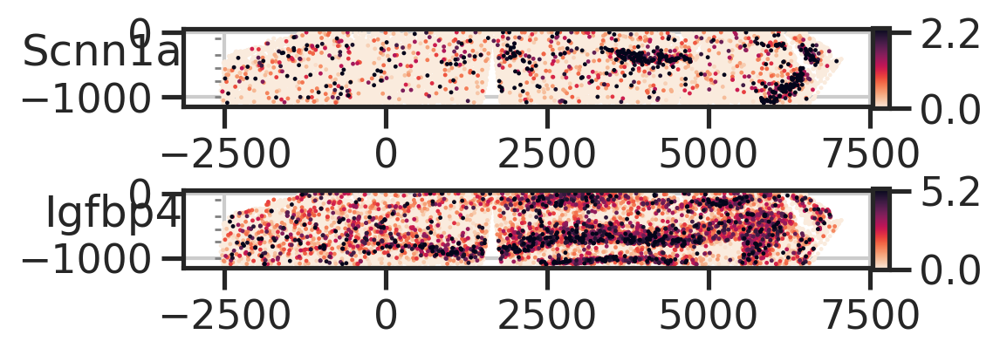

In [146]:
gns = [ 
    'Scnn1a', 'Igfbp4', #'Syt17', 'Rorb', #'Chrm2', 'Epha6',  
] 
x =   adatasub.obs['width']
y =  -adatasub.obs['depth']
n = len(gns)

fig, axs = plt.subplots(n,1,figsize=(1*6,n*1.2))
for i, (ax, gn) in enumerate(zip(axs, gns)):
    
    g = np.log2(1+adatasub[:,gn].layers['jnorm'].reshape(-1,))
    vmax = np.percentile(g, 99)
    vmin = np.percentile(g,  0)
    sorting = np.argsort(g)
    
    p = utils_merfish.st_scatter_ax(fig, ax,  x[sorting],  y[sorting],  gexp=g[sorting], s=3, title='', vmin=vmin, vmax=vmax, cmap='rocket_r')
    ax.set_aspect('equal')
    
    ax.set_title(gn, loc='left', va='center', ha='right', y=0.5, pad=None)
    fig.colorbar(p, pad=0, shrink=0.5, aspect=5, ticks=[np.round(vmin, decimals=1), np.round(vmax-0.1, decimals=1)])
    
   # ax.hlines(-np.arange(0,1200,200), np.min(x)-100, np.min(x), color='gray', linestyle='-', linewidth=1)
    ax.hlines(-np.array([100,350,550,750,1000]), np.min(x)-100, np.min(x), color='gray', linestyle='-', linewidth=1)
    ax.axis('on')
fig.subplots_adjust(hspace=0)
plt.show()

In [ ]:
bins = np.arange(500,6000+1, 250)
midbins = bins[:-1]+250/2

df = adatasub.obs.copy()
df['g'] = np.log2(1+np.array(adatasub[:,'Scnn1a'].layers['jnorm'][...])) # .reshape(-1,)
df = df[((df['depth']>350)&(df['depth']<550))] # take L4

df2 = adatasub.obs.copy()
df2['g'] = np.log2(1+np.array(adatasub[:,'Igfbp4'].layers['jnorm'][...])) # .reshape(-1,)
df2 = df2[((df2['depth']>150)&(df2['depth']<350))] # take L234

In [ ]:
df['width_bin'] = pd.cut(df['width'], bins)
dfmean = df[['width_bin', 'g']].groupby('width_bin').mean()

df2['width_bin'] = pd.cut(df2['width'], bins)
dfmean2 = df2[['width_bin', 'g']].groupby('width_bin').mean()

In [ ]:
fig, ax = plt.subplots(figsize=(5,3))
ax.plot(midbins, dfmean['g'].values, color='red')
ax.plot(midbins, dfmean2['g'].values, color='blue')
ax.set_ylabel('log expr')
ax.set_xlabel('M-L distance (um)')
sns.despine(ax=ax)
ax.grid(False) # , axis='y')
ax.xaxis.set_ticks(np.arange(500,6000+1,500), minor=True)
plt.show()


# select V1 glut neurons

In [ ]:
clsts_sel = [2,3,4,6,8,9]
clsts_sel = [3,4,6]
with sns.axes_style('white'): 
    fig, ax = plt.subplots()
    cond0 = np.logical_and(adatasub.obs['width']>1500, adatasub.obs['width']<3500)
    xr    = adatasub[cond0].obs['x']
    yr    = adatasub[cond0].obs['y']
    clsts = adatasub[cond0].obs['blended_domains'].astype(int) # requires [0,1,2...,N]
    clsts_this = clsts.copy()
    clsts_this[~clsts_this.isin(clsts_sel)] = -1
    clsts_this += 1
    
    utils_merfish.plot_cluster_simple_ax(fig, ax, clsts_this, xr, yr, s=2, cmap=clsts_cmap2) # cmap=plt.cm.tab20)
    plt.show()

In [ ]:
cond1 = adatasub.obs['blended_domains'].astype(int).isin(clsts_sel)

In [ ]:
num_transcripts = adatasub.obs['transcript_count']
sns.histplot(np.log10(num_transcripts))

In [ ]:
cond2 = num_transcripts > 50

In [ ]:
adata_sel_raw = adatasub[cond0 & cond1 & cond2] # anatomical (V1 ctx), cell types, num transcripts
adata_sel_raw

In [ ]:
# hvgs_merfish = get_hvgs(adata_sel, 'norm')
# adata_sel[:,hvgs_merfish]

# RNA data basic analysis 

In [ ]:
def preprocessing(adata):
    # filter genes
    cond = np.ravel((adata.X>0).sum(axis=0)) > 10 # expressed in more than 10 cells
    adata_sub = adata[:,cond]

    # counts
    x = adata_sub.X
    cov = adata_sub.obs['n_counts'].values

    # CP10k
    xn = (sparse.diags(1/cov).dot(x))*1e4

    # log10(CP10k+1)
    xln = xn.copy()
    xln.data = np.log10(xln.data+1)

    adata_sub.layers['norm'] = xn
    adata_sub.layers['lognorm'] = xln
    
    return adata_sub

In [ ]:
def get_hvgs(adata, layer, nbin=20, qth=0.3):
    """
    """
    xn = adata.layers[layer]
    
    # min
    gm = np.ravel(xn.mean(axis=0))

    # var
    tmp = xn.copy()
    tmp.data = np.power(tmp.data, 2)
    gv = np.ravel(tmp.mean(axis=0))-gm**2

    # cut 
    lbl = pd.qcut(gm, nbin, labels=np.arange(nbin))
    gres = pd.DataFrame()
    gres['lbl'] = lbl
    gres['mean'] = gm
    gres['var'] = gv
    gres['ratio']= gv/gm

    # select
    gres_sel = gres.groupby('lbl')['ratio'].nlargest(int(qth*(len(gm)/nbin))) #.reset_index()
    gsel_idx = np.sort(gres_sel.index.get_level_values(1).values)

    assert np.all(gsel_idx != -1)
    
    return adata.var.index.values[gsel_idx]

In [ ]:
#
f = '/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/cheng21_cell_scrna/organized/P28NR.h5ad'
adata_rna_raw = sc.read(f)
adata_rna_raw

In [ ]:
adata_rna_raw = adata_rna_raw[~adata_rna_raw.obs['subclass'].isnull()]
adata_rna_raw = preprocessing(adata_rna_raw)
adata_rna_raw

In [ ]:
hvgs = get_hvgs(adata_rna_raw, 'norm')
adata_rna = adata_rna_raw[:,hvgs]
adata_rna

In [ ]:
# genes overlap
genes_overlap = np.intersect1d(adata_rna.var.index.values, adata_sel_raw.var.index.values)
genes_overlap.shape

In [ ]:
adata_rna = adata_rna[:,genes_overlap]
adata_rna

In [ ]:
zlognorm = stats.zscore(np.array(adata_rna.layers['lognorm'].todense()), axis=0)
pca = PCA(n_components=50, random_state=0)
pcs = pca.fit_transform(zlognorm)
adata_rna.obsm['X_pca'] = pcs

In [ ]:
sc.pp.neighbors(adata_rna, use_rep='X_pca')
sc.tl.umap(adata_rna)

In [ ]:
sc.pl.umap(adata_rna, color=["subclass"])

# integration - everything to everything - now good and takes too long

In [ ]:
genes_overlap.shape, genes_overlap

In [ ]:
adata_rna = adata_rna[:,genes_overlap]
adata_mer = adata_sel_raw[:,genes_overlap]
adata_rna, adata_mer

In [ ]:
adata_rna.obs['modality'] = 'rna'
adata_mer.obs['modality'] = 'merfish'
adata_merge = sc.concat([adata_rna, adata_mer], join='outer')
# adata_merge.obs.loc[adata_rna.obs.index, 'subclass'] = adata_rna.obs['subclass']
# adata_merge.obs.loc[adata_mer.obs.index, 'transcript_count'] = adata_mer.obs['transcript_count']

lognorm_rna = np.log10(1+np.array(adata_rna.layers['norm'].todense()))
zlognorm_rna = stats.zscore(lognorm_rna, axis=0)

lognorm_mer = np.log10(1+adata_mer.layers['norm'])
zlognorm_mer = stats.zscore(lognorm_mer, axis=0)

adata_merge.obsm['X_pca2'] = PCA(n_components=20).fit_transform(np.vstack([zlognorm_rna, zlognorm_mer])) 
adata_merge

In [ ]:
sc.external.pp.harmony_integrate(adata_merge, 'modality', basis='X_pca2', max_iter_harmony=20)

In [ ]:
sc.pp.neighbors(adata_merge, use_rep='X_pca_harmony')
sc.tl.umap(adata_merge) # , key='modality')
adata_merge.obs['umap1'] = adata_merge.obsm['X_umap'][:,0]
adata_merge.obs['umap2'] = adata_merge.obsm['X_umap'][:,1]

In [ ]:
sc.pl.umap(adata_merge, color=["modality"])
sc.pl.umap(adata_merge, color=["subclass"])
sc.pl.umap(adata_merge, color=["transcript_count"])
sc.pl.umap(adata_merge, color=["volume"])

In [ ]:
# label transfer from RNA data
from sklearn.neighbors import KNeighborsClassifier

ref = adata_merge[adata_rna.obs.index].copy()
qry = adata_merge[adata_mer.obs.index].copy()
knnc = KNeighborsClassifier(n_neighbors=30)

# report distance cutoff
knnc.fit(ref.obsm['X_pca_harmony'], ref.obs['subclass'].values)

qry.obs['pred'] = knnc.predict(qry.obsm['X_pca_harmony'])
ref.obs['pred'] = knnc.predict(ref.obsm['X_pca_harmony'])
adata_merge.obs['pred'] = knnc.predict(adata_merge.obsm['X_pca_harmony'])

In [ ]:
from sklearn.neighbors import NearestNeighbors

def neighbor_label_transfer(k, ref_emb, qry_emb, ref_lbl, p_cutoff=0.5, dist_cutoff=None):
    """ref vs qry neighbors
    """
    unq_lbls = np.unique(ref_lbl).astype(str) # array(['L2/3_A', 'L2/3_B', 'L2/3_C'])
    n_unq_lbls = len(unq_lbls)
    ref_n = len(ref_emb)
    qry_n = len(qry_emb)
    
    neigh = NearestNeighbors(n_neighbors=k) # , radius=0.4)
    neigh.fit(ref_emb)
    dists, idx = neigh.kneighbors(qry_emb, k, return_distance=True)
    
    raw_pred = ref_lbl[idx]

    # p
    pabc = np.empty((qry_n, n_unq_lbls))
    for i, lbl in enumerate(unq_lbls):
        p = np.sum(raw_pred==lbl, axis=1)/k
        pabc[:,i] = p

    # max
    max_pred = unq_lbls[np.argmax(pabc, axis=1)]

    # 
    gated_pred = max_pred.copy()
    cond1 = np.max( pabc, axis=1) > p_cutoff
    gated_pred[~cond1] = 'NA' 
    if dist_cutoff is not None:
        cond2 = np.max(dists, axis=1) < dist_cutoff
        gated_pred[~cond2] = 'NA' 
    
    return max_pred, gated_pred, np.max(dists, axis=1)


def neighbor_self_nonself(k, ref_emb, qry_emb):
    """ref vs qry neighbors
    """
    unq_lbls = np.unique(ref_lbl).astype(str) # array(['L2/3_A', 'L2/3_B', 'L2/3_C'])
    n_unq_lbls = len(unq_lbls)
    ref_n = len(ref_emb)
    qry_n = len(qry_emb)
    lbls = np.array([0]*ref_n+[1]*qry_n)
    
    neigh = NearestNeighbors(n_neighbors=k) # , radius=0.4)
    neigh.fit(np.vstack([ref_emb, qry_emb]))
    idx = neigh.kneighbors(qry_emb, k, return_distance=False)
    
    isself = lbls[idx]

    p = np.sum(isself, axis=1)/k

    
    return p # max_pred, gated_pred, np.max(dists, axis=1)

In [ ]:
ref_emb = ref.obsm['X_pca_harmony']
qry_emb = qry.obsm['X_pca_harmony']
ref_lbl = ref.obs['subclass'].values.astype(str) # res_nr['type'].values.astype(str)
print(np.unique(ref_lbl))

k = 100
max_pred, _, dists = neighbor_label_transfer(k, ref_emb, qry_emb, ref_lbl, p_cutoff=0.5, dist_cutoff=None)
ps = neighbor_self_nonself(k, ref_emb, qry_emb)

adata_merge.obs['max_pred'] = 'NA' 
adata_merge.obs['frac_self_neighbors'] = np.nan # 'NA'
adata_merge.obs['gated_pred'] = 'NA'

adata_merge.obs.loc[qry.obs.index, 'max_pred'] = max_pred
adata_merge.obs.loc[qry.obs.index, 'frac_self_neighbors'] = ps
adata_merge.obs.loc[qry.obs.index, 'gated_pred'] = np.where(ps < 0.98, max_pred, 'NA')

In [ ]:
adata_snrnasq = adata_merge[adata_rna.obs.index] #adata_merge.obs['modality']=='merfish']
adata_merfish = adata_merge[adata_mer.obs.index] #adata_merge.obs['modality']=='merfish']
adata_snrnasq, adata_merfish

In [ ]:
sc.pl.umap(adata_snrnasq, color=['subclass'])
sc.pl.umap(adata_merfish, color=['gated_pred'])
sc.pl.umap(adata_merfish, color=['frac_self_neighbors'], vmin=0.95)

In [ ]:
sns.color_palette('tab20')

In [ ]:
x =   adata_merfish.obs['width']
y =  -adata_merfish.obs['depth']
ux =  adata_merfish.obsm['X_umap'][:,0]
uy =  adata_merfish.obsm['X_umap'][:,1]
clsts_lbl = adata_merfish.obs['gated_pred'].values
clsts, _ = pd.factorize(clsts_lbl) # .astype(int) # requires [0,1,2...,N]
clsts_palette, clsts_cmap = generate_discrete_cmap([len(np.unique(clsts))], keys=['Set2',])

csel = 'tab20'
clsts_palette2 = {
    'L2/3': sns.color_palette(csel, 8)[0], # 'C0', 
    'L4'  : sns.color_palette(csel, 8)[1], 
    'L5IT': sns.color_palette(csel, 8)[2], 
    'L5NP': sns.color_palette(csel, 8)[3], 
    'L5PT': sns.color_palette(csel, 8)[4], 
    'L6IT': sns.color_palette(csel, 8)[5], 
    'L6CT': sns.color_palette(csel, 8)[6], 
    'L6b' : sns.color_palette(csel, 8)[7],
    'NA': 'gray',
}
np.sort(_)

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(1*3,1*3))
# c = np.log10(adata_merfish.obs['transcript_count'].values)
c = adata_merfish.obs['transcript_count'].values

sorting = np.argsort(c) # [::-1]
# g = ax.scatter(ux[sorting], uy[sorting], c=c[sorting], s=1, cmap='rocket_r') 
g = ax.scatter(ux, uy, c=c<100, s=1, cmap='rocket_r') 
ax.set_aspect('equal')
ax.axis('off')
fig.colorbar(g)
plt.show()



In [ ]:
n = len(clsts_palette2.keys())
fig, axs = plt.subplots(1,n,figsize=(n*3,1*3))
for i, key in enumerate(clsts_palette2.keys()):
    ax = axs[i]
    c = (clsts_lbl==key).astype(int)
    sorting = np.argsort(c) # [::-1]
    num = c.sum()
    ax.scatter(x[sorting], y[sorting], c=c[sorting], s=1, cmap='rocket_r') 
    # ax.scatter(x, y, c=c, s=1, cmap='rocket_r') 
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_title(f'{key}, {num}')
plt.show()

n = len(clsts_palette2.keys())
fig, axs = plt.subplots(1,n,figsize=(n*3,1*3))
for i, key in enumerate(clsts_palette2.keys()):
    ax = axs[i]
    c = (clsts_lbl==key).astype(int)
    sorting = np.argsort(c) # [::-1]
    num = c.sum()
    ax.scatter(x[sorting], y[sorting], c=c[sorting], s=1, cmap='rocket_r') 
    # ax.scatter(x, y, c=c, s=1, cmap='rocket_r') 
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_title(f'{key}, {num}')
plt.show()

In [ ]:

with sns.axes_style('white'): 
    fig, axs = plt.subplots(1,2,figsize=(2*6,1*5))
    ax = axs[0]
    utils_merfish.plot_cluster_simple_ax(fig, ax, clsts, x, y, s=2, cmap=clsts_cmap) # cmap=plt.cm.tab20)
    
    ax = axs[1]
    utils_merfish.plot_cluster_simple_ax(fig, ax, clsts, ux, uy, s=2, cmap=clsts_cmap) # cmap=plt.cm.tab20)
    plt.show()

In [ ]:
fig, ax = plt.subplots()
sns.scatterplot(data=adata_merfish.obs.sample(frac=1, replace=False), 
                x='width', y='depth', 
                # x='x', y='y', 
                hue='gated_pred', palette=clsts_palette2, hue_order=list(clsts_palette2.keys()),
                s=10, edgecolor='none', ax=ax, rasterized=True)
ax.legend(bbox_to_anchor=(1,1))
ax.axis('off')
ax.set_aspect('equal')
ax.invert_yaxis()
powerplots.savefig_autodate(fig, os.path.join(outdir, 'fig1_dw.pdf'))
plt.show()

In [ ]:
fig, axs = plt.subplots(1,2,figsize=(5*2,4), sharex=True, sharey=True)
for ax, adata_mod, col in zip(axs, [adata_merfish, adata_snrnasq], ['gated_pred', 'subclass']):
    sns.scatterplot(data=adata_mod.obs.sample(frac=1, replace=False), 
                    x='umap1', y='umap2', 
                    hue=col, palette=clsts_palette2, hue_order=list(clsts_palette2.keys()),
                    s=10, edgecolor='none', ax=ax, rasterized=True)
    ax.legend(bbox_to_anchor=(1,1))
    ax.axis('off')
    ax.set_aspect('equal')
powerplots.savefig_autodate(fig, os.path.join(outdir, 'fig1_umap.pdf'))
plt.show()

In [ ]:
m =  adata_merge[adata_rna.obs.index].obs['subclass'].value_counts() # /len(adata_rna)
m = m/m.sum()
n =  adata_merge[adata_mer.obs.index].obs['gated_pred'].value_counts() # /len(adata_mer)).loc[m.index]
print(n.loc['NA']/n.sum())
n = n.loc[m.index]
n = n/n.sum()
# n = (n/n.sum()).loc[m.index]

m, n


In [ ]:
fig, ax = plt.subplots()
ax.scatter(m, n, color='k')
r, p = stats.spearmanr(m.values, n.values)
for i in range(len(m)):
    ax.text(m.iloc[i], n.iloc[i], m.index.values[i], fontsize=10)
    
ax.set_title(f"Spearman r={r:.2g}")

ax.plot([0, 0.3], [0, 0.3], '--', color='gray', zorder=0)
ax.set_aspect('equal')
ax.set_xticks([0,0.1,0.2,0.3])
ax.set_yticks([0,0.1,0.2,0.3])
sns.despine(ax=ax)

ax.set_xlabel('subclass freq. snRNA-seq')
ax.set_ylabel('subclass freq. MERFISH')
powerplots.savefig_autodate(fig, os.path.join(outdir, 'fig1_scatter.pdf'))
                            
plt.show()

# astrocytes genes

In [ ]:
astro_genes = np.sort([
    "Nr1d1",
    "Junb",
    "Mertk",
    "Slc1a3",
    "Nrxn1",
    "Sox21",
    "Fosl2",
    "Id3",
    "Stat2",
    "Klf3",
    "Rora",
    "Sdc4",
])
astro_genes

In [ ]:
astro_genes_overlap = np.intersect1d(astro_genes, genes)
astro_genes_overlap

# Redo QC, add norm, PCA

In [ ]:
# redo metrics
metrics = get_qc_metrics(adatasub2.obs)
# norm
nrmcnts = get_norm_counts(adatasub2)
# pca
adatasub2.obsm['pca'] = PCA(n_components=10).fit_transform(adatasub2.layers['norm'])


# check QCs
fig, axs = plt.subplots(1,3,figsize=(3*5,1*4))
for ax, (key, metric) in zip(axs, metrics.items()):
    (name, val, medval, bins) = metric
    
    sns.histplot(val, element='step', bins=bins, ax=ax, stat='percent')
    sns.despine(ax=ax)
    ax.axvline(medval, color='k',)
    ax.text(medval, 0, medval)
    ax.set_xlabel(name)
plt.show()

# check
gn = 'Slc17a7'
xr = adatasub2.obs['x']
yr = adatasub2.obs['y']
g = adatasub2[:,gn].layers['norm']
st_scatter(xr, yr, gexp=g, title=gn, cbar_label='norm count', axis_off=True)
plt.show()

# check
gn = 'Slc17a7'
d = adatasub2.obs['depth']
w = adatasub2.obs['width']
g = adatasub2[:,gn].layers['norm']
st_scatter(w, -d, gexp=g, title=gn, cbar_label='norm count', axis_off=True)
plt.show()

# Annotate V1 boundaries
- and add that to meta_operations

In [ ]:

bound_l, bound_r, bound_d = 3200, 4300, 400
cond = np.all([
    adatasub2.obs['width'] > bound_l, 
    adatasub2.obs['width'] < bound_r, 
    adatasub2.obs['depth'] < bound_d, 
], axis=0)
adatasub2.obs['inside_v1l23'] = cond
meta_operations['bound_lrd'] = [bound_l, bound_r, bound_d]

gns = ['Scnn1a', 'Rorb', 'Igfbp4', ]
n = len(gns)
x =  adatasub2.obs['width']
y = -adatasub2.obs['depth']

fig, axs = plt.subplots(n,1,figsize=(1*12,n*2), sharex=True, sharey=True)
fig.suptitle(name)
for ax, gn in zip(axs, gns):
    g = adatasub2[:,gn].layers['norm'].reshape(-1,)
    
    vmax = np.percentile(g, 99)
    vmin = np.percentile(g,  5)
    cond = g > 1e-5
    
    utils_merfish.st_scatter_ax(fig, ax, x[~cond], y[~cond], gexp=g[~cond], s=2, title='', vmin=vmin, vmax=vmax, cmap='rocket_r') #, axis_off=False)
    utils_merfish.st_scatter_ax(fig, ax,  x[cond],  y[cond],  gexp=g[cond], s=2, title='', vmin=vmin, vmax=vmax, cmap='rocket_r') #, axis_off=False)
    
    ax.set_title(gn, loc='left', ha='right', y=0.5)
    ax.axhline(-bound_d, linestyle='--', linewidth=1, color='gray', zorder=2)
    ax.axvline( bound_l, linestyle='--', linewidth=1, color='gray', zorder=2)
    ax.axvline( bound_r, linestyle='--', linewidth=1, color='gray', zorder=2)
    ax.grid(True)
    ax.axis('on')
    sns.despine(ax=ax)
    
plt.show()

In [ ]:
adatasub2.uns = meta_operations
adatasub2

In [ ]:
print(output)

In [ ]:
adatasub2.write(output)

In [ ]:
!ls /u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/organized/*240506.h5ad